### Perform Imports

In [ ]:
import numpy as np
import pandas as pd

# Load the CSV file into a DataFrame
file_path = r'b903b07f-b2a9-4983-b400-c4b025bb676f.csv'
df = pd.read_csv(file_path)

# Display the first few rows of the DataFrame
df.head()

,_id,case_name,post_id,type,incident-date,address,city,state,vspccd-number,about,...,victim-fields_age,victim-fields_race,victim-fields_eye-color,victim-fields_hair-color,contact-first-name,contact-last-name,contact-phone-number,contact-address,contact-email,geographic-location
0,1,Augusta County - Case: 2022-0003209 - Roger L....,1675,homicide,12/22/1967,NaN,Verona,Virginia,2022-0003209,Roger L. Crowder Sr. was murdered at a gas sta...,...,20,white,blue,blonde,Steven,Cason,540-487-9580,127 Lee Highway,scason@co.augusta.va.us,POINT (-79.00735 38.20302)
1,2,Augusta County - Case: 2018-0001702 - Keith Wh...,3123,missing-person,4/10/2018,NaN,Greenville,Virginia,2018-0001702,The Sheriff's Office is seeking the public's a...,...,48,white,brown,brown,Steven,Cason,(540) 245-5333,127 Lee Highway,scason@co.augusta.va.us,POINT (-79.15577424284099 38.00436074691171)
2,3,Augusta County - Case: 2021-0002588 - Khaleesi...,3121,homicide,1/10/2021,NaN,Waynesboro,Virginia,2021-0002588,"Khaleesi Hope Cuthriell, three years old, was ...",...,3,white,unknown,blonde,Steven,Cason,(540) 245-5333,127 Lee Highway,scason@co.augusta.va.us,POINT (-78.89352560356296 38.11053476443624)
3,4,Augusta County - Case: 2008-0002021 - Margaret...,1670,missing-person,5/13/2008,53 Spencer Ln Crimora,Crimora,Virginia,2008-0002021,"On July 29, 2008, Margaret Gail Stamper-White ...",...,36,white,blue,blonde,Steven,Cason,540-487-9580,127 Lee Highway,scason@co.augusta.va.us,POINT (-78.84252 38.15381)
4,5,"Augusta County - Case: 2012-0003059 - Robert ""...",1511,missing-person,11/11/2011,2775 Shenandoah Mountain Drive West Augusta,West Augusta,Virginia,2012-0003059,"Robert ""Bobby"" Fitzgerald went missing on Sund...",...,60,white,hazel,red,Steven,Cason,540-245-5333,"127 Lee Highway Verona, VA 24482",scason@co.augusta.va.us,POINT (-79.31525 38.26391)


In [2]:
df['type'].value_counts()

type
homicide               508
missing-person          70
unidentified-person     28
Name: count, dtype: int64

In [3]:
df.city.value_counts()[:10]

city
Richmond           125
Henrico County     121
Virginia Beach      90
Hampton             50
Chesterfield        37
Woodbridge          20
Roanoke County      10
Manassas             9
Virginia Beach       8
Winchester           5
Name: count, dtype: int64

We need to perform some basic cleaning for the datapoints. For the coordinates, we need to extract the numbers from the string, and adjust any where there is an issue with spacing. Then, we need to create coordinate columns for our dataframe.

In [4]:
df['coordinates'] = df['geographic-location'].str.extract(r'POINT \(([^)]+)\)')[0].str.replace(',', '').str.split()
df.at[306, 'coordinates'] = ['-77.47670711784883', '37.554369311138']
df['coordinates'] = df['coordinates'].apply(lambda x: [float(i) for i in x][::-1])
df['LAT_coord'], df['LON_coord'] = zip(*df['coordinates'])

### Load in the GeoDataFrame

In [5]:
import geopandas as gpd
from shapely.geometry import Point

# Load the GeoJSON file
geojson_url = 'https://data.virginia.gov/dataset/956da7a2-4e67-4885-bb2e-c7c81bd5909b/resource/d573ca07-5c35-44e0-8e94-1cacb922e1f2/download/virginia_city_county_census_boundaries.geojson'
gdf = gpd.read_file(geojson_url)

# Create a GeoDataFrame from the DataFrame
geometry = [Point(xy) for xy in zip(df['LON_coord'], df['LAT_coord'])]
df_gdf = gpd.GeoDataFrame(df, geometry=geometry)

Here, we will perform a geospatial join to classify points into counties.

In [6]:
# Ensure both GeoDataFrames use the same coordinate reference system
df_gdf = df_gdf.set_crs(gdf.crs, allow_override=True)

# Perform spatial join to classify each point into a county
df_gdf = gpd.sjoin(df_gdf, gdf, how='left')

# Extract the county name into a new series
df['county'] = df_gdf['NAMELSAD']

# Display the DataFrame with the new 'county' column
df.head()

,_id,case_name,post_id,type,incident-date,address,city,state,vspccd-number,about,...,contact-first-name,contact-last-name,contact-phone-number,contact-address,contact-email,geographic-location,coordinates,LAT_coord,LON_coord,county
0,1,Augusta County - Case: 2022-0003209 - Roger L....,1675,homicide,12/22/1967,NaN,Verona,Virginia,2022-0003209,Roger L. Crowder Sr. was murdered at a gas sta...,...,Steven,Cason,540-487-9580,127 Lee Highway,scason@co.augusta.va.us,POINT (-79.00735 38.20302),"[38.20302, -79.00735]",38.203020,-79.007350,Augusta County
1,2,Augusta County - Case: 2018-0001702 - Keith Wh...,3123,missing-person,4/10/2018,NaN,Greenville,Virginia,2018-0001702,The Sheriff's Office is seeking the public's a...,...,Steven,Cason,(540) 245-5333,127 Lee Highway,scason@co.augusta.va.us,POINT (-79.15577424284099 38.00436074691171),"[38.00436074691171, -79.15577424284099]",38.004361,-79.155774,Augusta County
2,3,Augusta County - Case: 2021-0002588 - Khaleesi...,3121,homicide,1/10/2021,NaN,Waynesboro,Virginia,2021-0002588,"Khaleesi Hope Cuthriell, three years old, was ...",...,Steven,Cason,(540) 245-5333,127 Lee Highway,scason@co.augusta.va.us,POINT (-78.89352560356296 38.11053476443624),"[38.11053476443624, -78.89352560356296]",38.110535,-78.893526,Augusta County
3,4,Augusta County - Case: 2008-0002021 - Margaret...,1670,missing-person,5/13/2008,53 Spencer Ln Crimora,Crimora,Virginia,2008-0002021,"On July 29, 2008, Margaret Gail Stamper-White ...",...,Steven,Cason,540-487-9580,127 Lee Highway,scason@co.augusta.va.us,POINT (-78.84252 38.15381),"[38.15381, -78.84252]",38.153810,-78.842520,Augusta County
4,5,"Augusta County - Case: 2012-0003059 - Robert ""...",1511,missing-person,11/11/2011,2775 Shenandoah Mountain Drive West Augusta,West Augusta,Virginia,2012-0003059,"Robert ""Bobby"" Fitzgerald went missing on Sund...",...,Steven,Cason,540-245-5333,"127 Lee Highway Verona, VA 24482",scason@co.augusta.va.us,POINT (-79.31525 38.26391),"[38.26391, -79.31525]",38.263910,-79.315250,Augusta County


### Find County Relationships

Here, we will start to calculate the spatial proximity between areal data. First, we will loop over each county and find those that are nearby. Then, we will convert this to 1 and 0 values in an adjacency matrix.

In [7]:
# Create an empty dictionary to store neighboring counties
neighboring_counties = {}

# Loop over each county to find its neighbors
for idx, county in gdf.iterrows():
    county_name = county['NAMELSAD']

    # Get neighboring counties based on different geometric relationships
    # 1. Counties that touch the edges of the current county
    neighbors_touching = gdf[gdf.geometry.touches(county.geometry)]['NAMELSAD'].tolist()

    # 2. Counties that intersect with the current county (this includes touching and overlapping boundaries)
    neighbors_intersecting = gdf[gdf.geometry.intersects(county.geometry)]['NAMELSAD'].tolist()

    # 3. Counties that are fully inside the current county (enclaves)
    enclaves = gdf[gdf.geometry.within(county.geometry)]['NAMELSAD'].tolist()

    # Combine all neighbors (touching, intersecting, and enclaves), remove duplicates
    neighbors = list(set(neighbors_touching + neighbors_intersecting + enclaves))
    
    # Remove the county itself from the neighbors list
    neighbors = [n for n in neighbors if n != county_name]
    
    # Store the neighboring counties in the dictionary
    neighboring_counties[county_name] = neighbors

# Display the neighboring counties
for county, neighbors in neighboring_counties.items():
    print(f"{county} borders: {', '.join(neighbors)}")


Galax city borders: Carroll County, Grayson County
Richmond city borders: Chesterfield County, Henrico County
Hopewell city borders: Chesterfield County, Prince George County
Northampton County borders: Virginia Beach city, Hampton city, York County, Middlesex County, Accomack County, Norfolk city, Poquoson city, Mathews County
Warren County borders: Clarke County, Fauquier County, Shenandoah County, Frederick County, Page County, Rappahannock County
Floyd County borders: Patrick County, Pulaski County, Montgomery County, Franklin County, Carroll County, Roanoke County
Staunton city borders: Augusta County
Bedford County borders: Lynchburg city, Pittsylvania County, Rockbridge County, Campbell County, Franklin County, Botetourt County, Bedford city, Amherst County, Roanoke County
Colonial Heights city borders: Chesterfield County, Petersburg city
Poquoson city borders: York County, Hampton city, Northampton County
Danville city borders: Pittsylvania County
Charlottesville city borders:

In [8]:
# Get the list of all counties
counties = list(neighboring_counties.keys())

# Initialize an empty DataFrame with counties as both rows and columns
adjacency_matrix = pd.DataFrame(index=counties, columns=counties)

# Fill the DataFrame
for county in counties:
    for neighbor in counties:
        if neighbor in neighboring_counties[county]:
            adjacency_matrix.at[county, neighbor] = 1
        else:
            adjacency_matrix.at[county, neighbor] = 0

# Display the adjacency matrix
adjacency_matrix

,Galax city,Richmond city,Hopewell city,Northampton County,Warren County,Floyd County,Staunton city,Bedford County,Colonial Heights city,Poquoson city,...,Norfolk city,Pulaski County,Middlesex County,Rockbridge County,Caroline County,Wythe County,Buchanan County,Giles County,Mecklenburg County,Grayson County
Galax city,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
Richmond city,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Hopewell city,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Northampton County,0,0,0,0,0,0,0,0,0,1,...,1,0,1,0,0,0,0,0,0,0
Warren County,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Wythe County,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,1
Buchanan County,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Giles County,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
Mecklenburg County,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [9]:
adjacency_matrix.sum().sum()

632

### Maps of Data

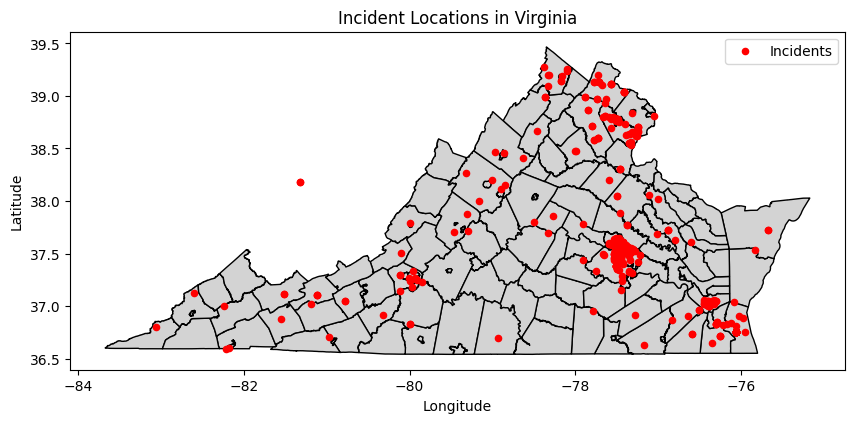

In [10]:
import matplotlib.pyplot as plt

# Plot the map of Virginia
fig, ax = plt.subplots(figsize=(10, 10))
gdf.plot(ax=ax, color='lightgrey', edgecolor='black')

# Plot the coordinates from the DataFrame
df.plot(kind='scatter', x='LON_coord', y='LAT_coord', color='red', ax=ax, label='Incidents')

# Set the title and labels
plt.title('Incident Locations in Virginia')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.legend()

# Show the plot
plt.show()

Here, we can see the point locations of Virginia, and see where the data falls within each area. There seem to be clusters in specific areas, even within counties.

In [11]:
#Import the population data from the census
pops = pd.read_csv('table-data.csv')

In [12]:
#Combine the data from df for the counts of cold cases and the population data by county
end_data = pd.merge(
    df.groupby('county').count()['state'].reset_index(),
    pops[['name','pop2024']],
    left_on='county',right_on='name',
    how='outer')

In [13]:
#calculate the cold case incidents per county
end_data['incidents_per_capita'] = (end_data['state']/end_data['pop2024']).fillna(0)

In [14]:
# Find the names in gdf that are not in end_data
missing_names = gdf[~gdf['NAMELSAD'].isin(end_data['name'])]['NAMELSAD']

# Remove the missing names from the counties list
counties = [county for county in counties if county not in missing_names.values]

In [15]:
# Do this to perform mapping between counties
end_data.set_index('name',inplace=True)

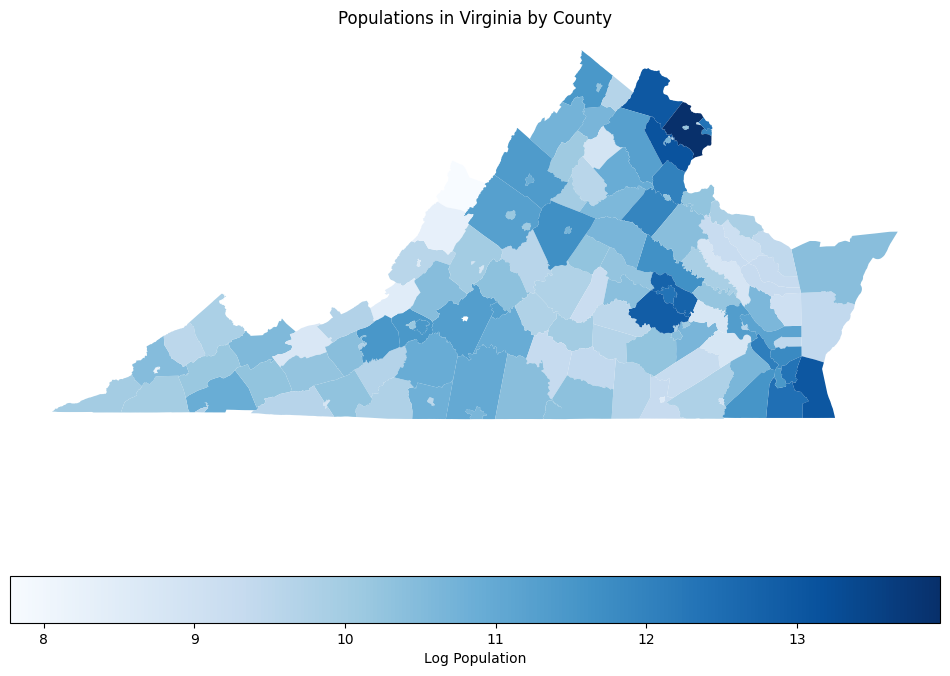

In [16]:
#View the populations in Virginia by county
gdf['populations'] = np.log(gdf['NAMELSAD'].map(end_data['pop2024']))

ax = gdf.plot(
    column='populations', cmap='Blues', 
    legend=True, figsize=(12, 12),
    legend_kwds={'label': "Log Population", 'orientation': "horizontal"}
)
ax.set_title('Populations in Virginia by County')
ax.set_axis_off();

### Calculate Moran's I

In [17]:
local_moran_I = pd.Series(index=counties)
gdf['local_moran_I'] = gdf['NAMELSAD'].map(local_moran_I)
gdf['incident_rates'] = gdf['NAMELSAD'].map(end_data['incidents_per_capita'])
gdf['incident_counts'] = gdf['NAMELSAD'].map(end_data['state'])

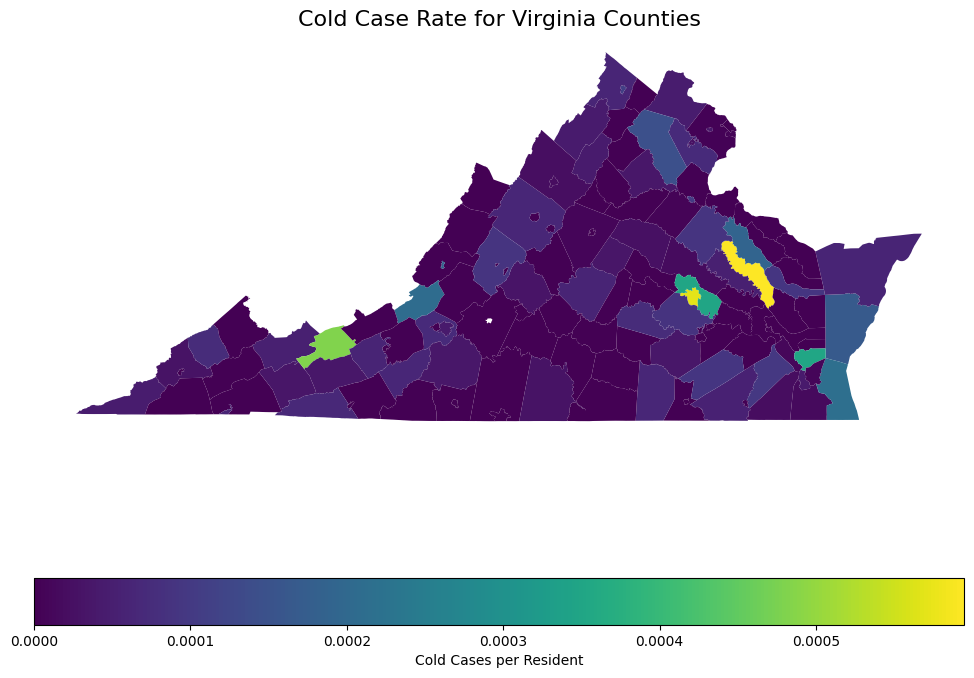

In [18]:
# Plot the incident rates
ax = gdf.plot(column='incident_rates', legend=True, vmin=0, figsize=(12, 12),
    legend_kwds={'label': "Cold Cases per Resident", 'orientation': "horizontal"})
ax.set_title('Cold Case Rate for Virginia Counties', fontsize=16)
ax.set_axis_off();  # Hide axes for a cleaner map

In [19]:
N = len(counties)
W = adjacency_matrix.sum().sum()

# column "state" is the count of cold cases
rates = end_data['incidents_per_capita'].fillna(0)
mean_rate = rates.mean()
local_moran_I = pd.Series(index=counties)

for i in counties:
    # Calculate the weighted sum for neighbors
    sum_weights = 0
    for j in counties:
        sum_weights += adjacency_matrix.at[i, j] * (rates[j] - mean_rate)
    
    # Local Moran's I formula
    local_moran_I[i] = N * (rates[i] - mean_rate) * sum_weights / W

denominator = ((rates - mean_rate) ** 2).sum()
local_moran_I = local_moran_I / denominator

print(f"Moran's I: {local_moran_I.sum()}")

Moran's I: 0.07886446120499975


In [20]:
gdf['local_moran_I'] = gdf['NAMELSAD'].map(local_moran_I)

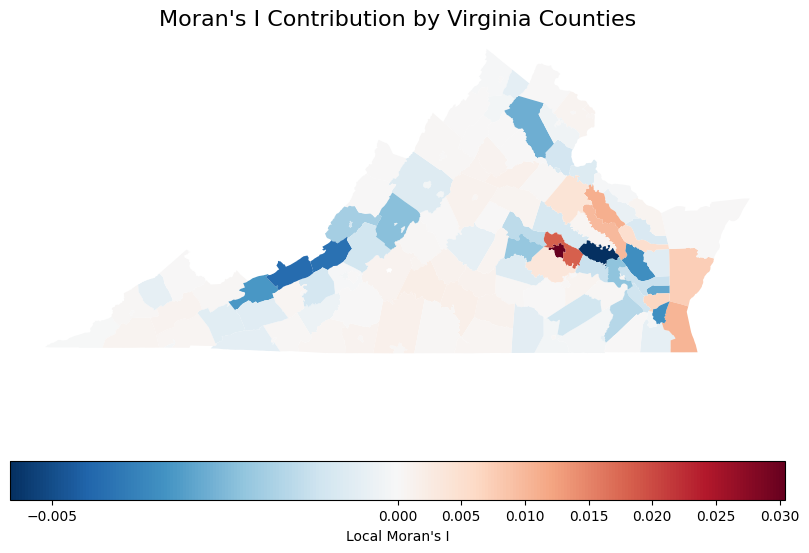

In [21]:
import matplotlib.colors as mcolors

# Plot the Moran's I values on the map using color shades
fig, ax = plt.subplots(figsize=(10, 8))

# Define a TwoSlopeNorm to center the color scale at zero
norm = mcolors.TwoSlopeNorm(vmin=gdf['local_moran_I'].min(), vcenter=0, vmax=gdf['local_moran_I'].max())

# Plot the Moran's I values
gdf.plot(column='local_moran_I', cmap='RdBu_r', legend=True, ax=ax, 
         norm=norm, 
         missing_kwds={"color": "white"}, 
         legend_kwds={'label': "Local Moran's I", 'orientation': "horizontal"})
ax.set_title('Moran\'s I Contribution by Virginia Counties', fontsize=16)
ax.set_axis_off()  # Hide axes for a cleaner map

### For Personal Interest

View the cases on a map and read about what happened in each.

In [22]:
import folium
from folium.plugins import MarkerCluster

# Create a base map
m = folium.Map(location=[37.4316, -78.6569], zoom_start=7)  # Centered on Virginia

# Add a choropleth layer for incident rates
folium.Choropleth(
    geo_data=gdf,
    name='choropleth',
    data=gdf,
    columns=['NAMELSAD', 'incident_rates'],
    key_on='feature.properties.NAMELSAD',
    fill_color='YlOrRd',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Incident Rates'
).add_to(m)

# Add markers for each incident
marker_cluster = MarkerCluster().add_to(m)
for idx, row in df.iterrows():
    folium.Marker(
        location=[row['LAT_coord'], row['LON_coord']],
        popup=f"{row['case_name']}: \n{row['about']}",
    ).add_to(marker_cluster)

# Add layer control
folium.LayerControl().add_to(m)

# Display the map
m